# Proof of concept for depth estimation

In [31]:
import os
import shutil
import socket
from pathlib import Path
import cv2
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
from utils import Colors, observe, plot_box_depth, xyxy2xywh, xywh2xyxy, copy_paste_image, move_image, copy_paste_label
from utils import cls_names, cls_dict # original class names
from sklearn.metrics import mean_squared_error
from math import sqrt

## Dataset location

In [2]:
hostname = socket.gethostname()
if hostname == "HAITI":
    # repo_folder = "C:/Users/xin/OneDrive - bwstaff/xin/yolov5/"
    dataset_folder = "D:/xin/datasets/CV/kitti/"
    # dataset_folder = "C:/Users/xin/Downloads/kitti"
if hostname == "BALI":
    # repo_folder = "/home//OneDrive/xin/yolov5/"
    dataset_folder = "/storage/xin/datasets/CV/kitti/"
    dataset_folder = "/home/xin/Datasets/kitti"
if hostname == "DESKTOP-SJ7KPPD":
    # repo_folder = "C:/Users/Xin/OneDrive - bwstaff/xin/yolov5/"
    # repo_folder = "C:/Users/Xin/git_repo_local/yolov5_local/"
    dataset_folder = "C:/Users/Xin/Datasets/kitti"
if hostname == "chen-Ubuntu":
    # repo_folder = "C:/Users/Xin/OneDrive - bwstaff/xin/yolov5/"
    # repo_folder = "C:/Users/Xin/git_repo_local/yolov5_local/"
    dataset_folder = ".."

# repo_folder = Path(repo_folder)
dataset_folder = Path(dataset_folder)
dataset_source_folder = dataset_folder / "Source"  # original downloaded dataset is here


In [3]:
# source image paths
src_training_folder = dataset_source_folder / "training"
src_training_image_folder = src_training_folder / "image_2"
src_training_image_path_list = sorted(list(src_training_image_folder.glob("**/*.png")))

src_training_label_folder = src_training_folder / "label_2"
src_training_label_path_list = sorted(list(src_training_label_folder.glob("**/*.txt")))


## show images

../Source/training/image_2/000003.png
../Source/training/label_2/000003.txt
375 1242 3
['Car', '0.00', '0', '1.55', '614.24', '181.78', '727.31', '284.77', '1.57', '1.73', '4.15', '1.00', '1.75', '13.22', '1.62']
['DontCare', '-1', '-1', '-10', '5.00', '229.89', '214.12', '367.61', '-1', '-1', '-1', '-1000', '-1000', '-1000', '-10']
['DontCare', '-1', '-1', '-10', '522.25', '202.35', '547.77', '219.71', '-1', '-1', '-1', '-1000', '-1000', '-1000', '-10']


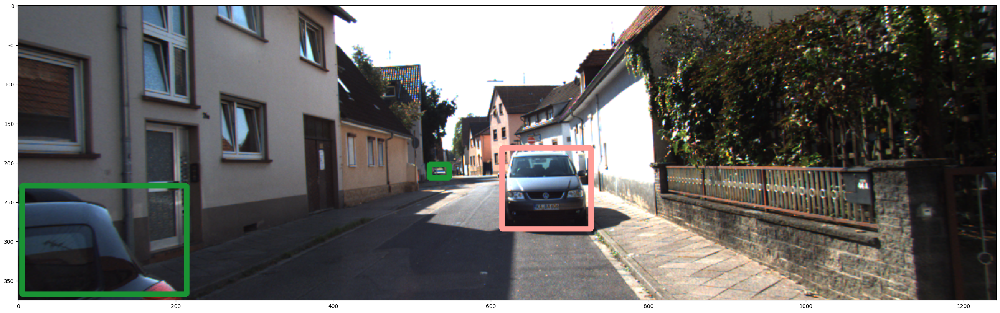

In [4]:
# check one out in original kitti format
observe(
    num=3,
    image_list=src_training_image_path_list,
    label_list=src_training_label_path_list,
    xyxy=True,
)

## Generate kitti_person
1. only extract person class
2. transform labels to yolo format
3. copy images and labels to corresponding folders according to the requirement of yolo

In [7]:
# modified class names for data extraction
classes = [
    "Person",
]

classes_dict = {
    "Pedestrian": 0,
    # "Person_sitting": 0,
    # "Cyclist": 0,
    # "Car": 1,
    # "Van": 1,
    # "Truck": 1,
    # "Tram": 1,
}


In [8]:
def txt_kitti2yolo_person(image_path_list, label_path_list):
    """
    Args:
        image_path: path list to images
        label_path: path list to labels
        xyxy: True if label is in xyxy format, False if label is in xywh format

    Return:
        txt_list: LIST of list of strings,
                    each string is A line in txt file
                    each item in list is ALL lines of txt file
                    each item in LIST is a list of strings extracted form ONE txt file
        img_list: LIST of images with multiple persons in it
        label_list: LIST of labels with multiple persons in it
    """
    txt_list = []
    img_list = []
    label_list = []

    for image_path, label_path in zip(image_path_list, label_path_list):
        with open(label_path) as f:
            lines = f.readlines()
            lines = [line.split() for line in lines]

            # # if not in classes, skip
            # if not any([line[0] in classes for line in lines]):
            #     continue

            # to store labels for one file
            txt_temp = []

            # read image info
            img = cv2.imread(str(image_path))
            height, width, channels = img.shape

            # deal with each line in label file
            for line in lines:
                # extract images only with multiple persons in it
                if not line[0] == "Pedestrian":
                    continue
                # kitti originally records top-left and bottom-right coordinates
                # but coco records center and size
                c = int(classes_dict[line[0]])
                x0 = float(line[4]) / width
                y0 = float(line[5]) / height
                x1 = float(line[6]) / width
                y1 = float(line[7]) / height

                # preprocessing for depth
                # TODO: is it the best way?
                # clip negative depth to zero, so that depths are in [0, 146.85]
                d = max(0, float(line[13]))
                # change to [0, 1] by dividing 146.85
                # d /= 146.85

                # xyxy to xywh
                w = x1 - x0
                h = y1 - y0
                xc = (x0 + x1) / 2
                yc = (y0 + y1) / 2

                # keep 6 digits as in coco
                w = round(w, 6)
                h = round(h, 6)
                xc = round(xc, 6)
                yc = round(yc, 6)
                d = round(d, 6)

                # append to txt_temp
                txt_temp.append(f"{c} {xc} {yc} {w} {h} {d}")
            if len(txt_temp) > 1:
                # save new txt only when there're multiple persons in the image
                txt_list.append(txt_temp)
                img_list.append(image_path)
                label_list.append(label_path)
    return txt_list, img_list, label_list


txt_list, img_list, label_list = txt_kitti2yolo_person(src_training_image_path_list, src_training_label_path_list)

In [ ]:
# from sklearn.model_selection import train_test_split
# # train val split
# (
#     train_txt_list,
#     val_txt_list,
#     train_img_list,
#     val_img_list,
#     train_label_list,
#     val_label_list
# ) = train_test_split(
#     txt_list, 
#     img_list, 
#     label_list
#     test_size=0.2,
#     random_state=SEED,
# )

In [10]:
# copy paste images and labels to new folder
kitti_person_folder = dataset_folder / "kitti_multi_person"
image_dir = kitti_person_folder / "images"
label_dir = kitti_person_folder / "labels"
label_dir_depth = kitti_person_folder / "labels_depth"

# copy paste images
copy_paste_image(img_list, image_dir)

# labels with depth
copy_paste_label(label_list, txt_list, label_dir_depth, depth=True)

Directory ../kitti_multi_person/images created.
Copying files to ../kitti_multi_person/images...
Done.
Directory ../kitti_multi_person/labels_depth created.
Copying files to ../kitti_multi_person/labels_depth...
Done.


#### load and plot

In [11]:
kitti_person_folder = dataset_folder / "kitti_multi_person"
image_dir = kitti_person_folder / "images"
# label_dir = kitti_person_folder / "labels"
label_dir_depth = kitti_person_folder / "labels_depth"

target_image_path_list = sorted(list(Path(image_dir ).glob("**/*.png")))
target_label_path_list = sorted(list(Path(label_dir_depth).glob("**/*.txt")))

../kitti_multi_person/images/000011.png
../kitti_multi_person/labels_depth/000011.txt
375 1242 3
['0', '0.733104', '0.537547', '0.043213', '0.306293', '12.42']
['0', '0.727512', '0.544227', '0.0481', '0.277253', '13.43']
['0', '0.528941', '0.499333', '0.012343', '0.102133', '34.08']
['0', '0.204658', '0.60256', '0.022279', '0.190133', '15.95']


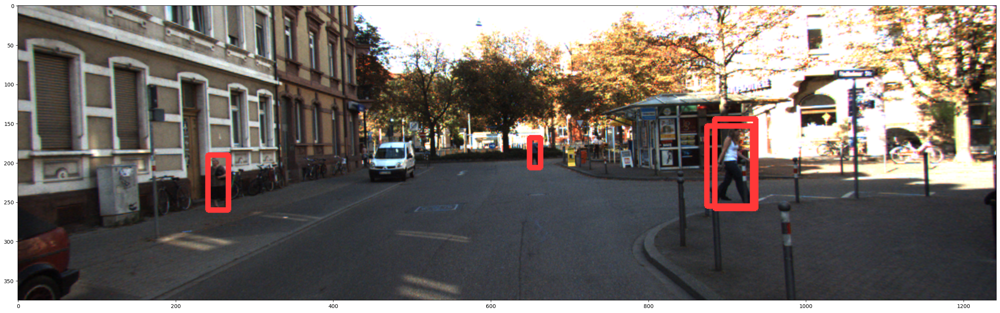

In [12]:
observe(0, target_image_path_list, target_label_path_list,xyxy=False)

#### show depth in image

['0', '0.52103', '0.61607', '0.035485', '0.371123', '9.43']
['0', '0.569051', '0.602406', '0.045258', '0.378289', '9.71']
['0', '0.236753', '0.624024', '0.049612', '0.404626', '9.02']
['0', '0.594871', '0.517233', '0.014039', '0.167246', '19.16']


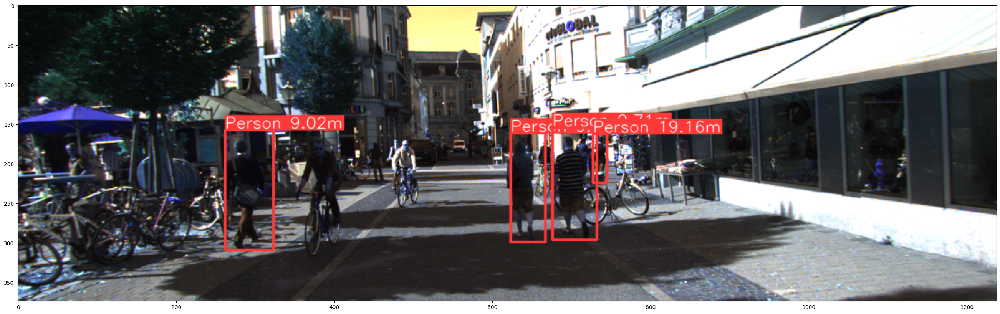

In [13]:
plot_box_depth(500, target_image_path_list, target_label_path_list)

## proof of concept: depth estimation from geometrical assumption

- use the closest object as reference (with known depth) and estimate the depth of other objects based on geometrical assumpations and similarities of human bodies.
- directly use ground truth bounding boxes coordinates 

In [99]:
# assumpations, normal width of a person is 0.4m
WIDTH = 0.4

gts = []
preds = []
# choose one as reference and get the depth of other ones
for i, (image_path, label_path) in enumerate(zip(target_image_path_list ,target_label_path_list)):
    # read image info
    img = cv2.imread(str(image_path))
    height, width, channels = img.shape

    with open(label_path) as f:
        targets = f.readlines()
    targets = [line.split() for line in targets]

    # choose the first one as reference
    ref = targets[0]
    ref_depth = float(ref[5])
    ref_w = float(ref[3]) * width
    z = ref_w * ref_depth / WIDTH 

    # get the depth of other ones
    for target in targets[1:]:
        w = float(target[3]) * width
        d_gt = float(target[5])
        d_pred = z/w*WIDTH
        if d_pred>150:
            print("ignore one label in image no.",i,"because the depth is too large")
            print(target)
            break
        gts.append(d_gt)
        preds.append(d_pred)
gts = np.array(gts)
preds = np.array(preds)
mask = gts<10
print("RMSE:",f"{sqrt(mean_squared_error(gts, preds)):.2f} m")
print("RMSE < 10m:",f"{sqrt(mean_squared_error(gts[mask], preds[mask])):.2f} m")


ignore one label in image no. 464 because the depth is too large
['0', '0.999138', '0.397784', '9e-05', '0.036541', '11.81']
RMSE: 7.52 m
RMSE < 10m: 3.06 m


In [100]:
# assumpations, normal height of a person is 1.8 m

HEIGHT = 1.8

gts = []
preds = []
# choose one as reference and get the depth of other ones
for i, (image_path, label_path) in enumerate(zip(target_image_path_list ,target_label_path_list)):
    # read image info
    img = cv2.imread(str(image_path))
    height, width, channels = img.shape

    with open(label_path) as f:
        targets = f.readlines()
    targets = [line.split() for line in targets]

    # change element type to float
    targets = [[float(e) for e in line] for line in targets]

    # sort by depth
    targets = sorted(targets, key=lambda x: x[5])

    # choose the first(closest) one as reference
    ref = targets[0]
    ref_depth = ref[5]
    ref_h = ref[4] * height
    z = ref_h * ref_depth / HEIGHT 

    # get the depth of other ones
    for target in targets[1:]:
        w = target[4] * height
        d_gt = target[5]
        d_pred = z/w*HEIGHT
        if d_pred>150:
            print("ignore one label in image no.",i,"because the depth is too large")
            print(target)
            break
        gts.append(d_gt)
        preds.append(d_pred)
gts = np.array(gts)
preds = np.array(preds)
mask = gts<10
print("RMSE:",f"{sqrt(mean_squared_error(gts, preds)):.2f} m")
print("RMSE < 10m:",f"{sqrt(mean_squared_error(gts[mask], preds[mask])):.2f} m")

RMSE: 2.75 m
RMSE < 10m: 1.55 m


### statistics

In [67]:
# extract width and height and depth for all objects
ws = []
hs = []
ds = []

for image_path, label_path in zip(target_image_path_list ,target_label_path_list):
    # read image info
    img = cv2.imread(str(image_path))
    height, width, channels = img.shape

    # read labels
    with open(label_path) as f:
        targets = f.readlines()
    targets = [line.split() for line in targets]
    # change element type to float
    targets = [[float(e) for e in line] for line in targets]
    # sort by depth
    targets = sorted(targets, key=lambda x: x[5])

    for target in targets:
        w = int(target[3]*width)
        h = int(target[4]*height)
        d = target[5]
        ws.append(w)
        hs.append(h)
        ds.append(d)
ws, hs, ds = np.array(ws), np.array(hs), np.array(ds)

There are 72 objects in the depth range of 4m to 5m


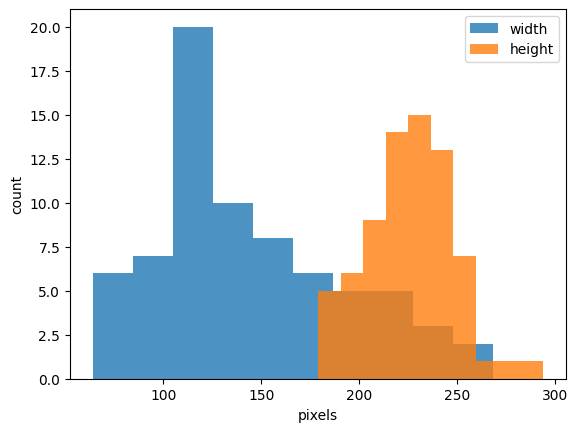

In [97]:
# check the bin plot of object widths and heights within a depth range
mask = (ds>4) & (ds<5)
print(f'There are {mask.sum()} objects in the depth range of 4m to 5m')
plt.hist(ws[mask],bins=10, alpha=0.8, label="width");
plt.hist(hs[mask],bins=10, alpha=0.8, label="height");
plt.xlabel("pixels")
plt.ylabel("count")
plt.legend();

There are 38 objects in the depth range of 3m to 4m
38


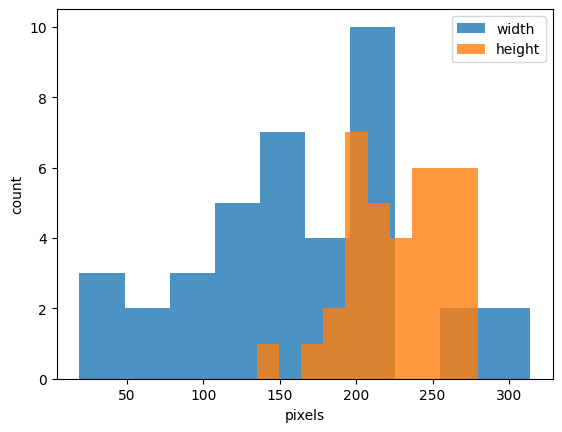

In [98]:
# check the bin plot of object widths and heights within a depth range
mask = (ds>3) & (ds<4)
print(f'There are {mask.sum()} objects in the depth range of 3m to 4m')
print(sum(mask))
plt.hist(ws[mask],bins=10, alpha=0.8, label="width");
plt.hist(hs[mask],bins=10, alpha=0.8, label="height");
plt.xlabel("pixels")
plt.ylabel("count")
plt.legend();

## proof of concept: depth estimation from predicted depth map

- use the closest object as reference (with known depth) and estimate the depth of other objects based on predicted depth map (by midas)
- directly use ground truth bounding boxes coordinates 

## test code

In [136]:
# from midas repo
import re
def read_pfm(path):
    """Read pfm file.

    Args:
        path (str): path to file

    Returns:
        tuple: (data, scale)
    """
    with open(path, "rb") as file:

        color = None
        width = None
        height = None
        scale = None
        endian = None

        header = file.readline().rstrip()
        if header.decode("ascii") == "PF":
            color = True
        elif header.decode("ascii") == "Pf":
            color = False
        else:
            raise Exception("Not a PFM file: " + path)

        dim_match = re.match(r"^(\d+)\s(\d+)\s$", file.readline().decode("ascii"))
        if dim_match:
            width, height = list(map(int, dim_match.groups()))
        else:
            raise Exception("Malformed PFM header.")

        scale = float(file.readline().decode("ascii").rstrip())
        if scale < 0:
            # little-endian
            endian = "<"
            scale = -scale
        else:
            # big-endian
            endian = ">"

        data = np.fromfile(file, endian + "f")
        shape = (height, width, 3) if color else (height, width)

        data = np.reshape(data, shape)
        data = np.flipud(data)

        return data, scale

In [137]:
depth_map_dir = Path('/mnt/Win/Users/Xin/git_repo_local/MiDaS/output/kitti_multi_person')

kitti_person_folder = dataset_folder / "kitti_multi_person"
image_dir = kitti_person_folder / "images"
label_dir_depth = kitti_person_folder / "labels_depth"

target_image_path_list = sorted(list(Path(image_dir ).glob("**/*.png")))
target_label_path_list = sorted(list(Path(label_dir_depth).glob("**/*.txt")))

In [203]:
i=1
img_path = target_image_path_list[i]
label_path = target_label_path_list[i]
depth_map_path = depth_map_dir / "".join([img_path.stem, "-dpt_beit_large_512", ".pfm"])

In [249]:
inv_depth, scale = read_pfm(depth_map_path)
depth = 1/inv_depth # since midas uses inverse depth

In [241]:
img = cv2.imread(str(img_path))
height, width, channel = img.shape

In [242]:
with open(label_path) as f:
    targets = f.readlines()
targets = [line.split() for line in targets]
# change element type to float
targets = [[float(e) for e in line] for line in targets]
# sort by depth
targets = sorted(targets, key=lambda x: x[5])

boxes_xywh = [] # store the boxes in yolo format
ds = [] # store the absolute ground truth depth

for line in targets:
    # xywh and in yolo format
    n = int(line[0])
    xc = int(width * float(line[1]))
    yc = int(height * float(line[2]))
    w = int(width * float(line[3]))
    h = int(height * float(line[4]))
    d = float(line[5])

    boxes_xywh.append([xc, yc, w, h])
    ds.append(d)
    
boxes_xywh = np.array(boxes_xywh)
boxes_xyxy = xywh2xyxy(boxes_xywh)


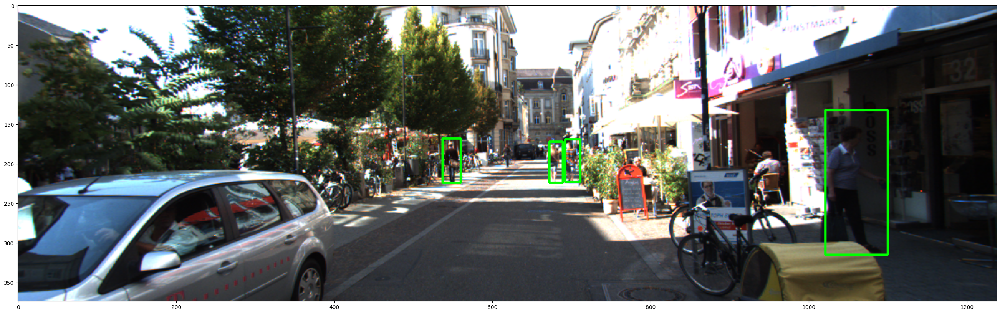

In [244]:
for xyxy in boxes_xyxy:
    cv2.rectangle(img, (xyxy[0], xyxy[1]), (xyxy[2], xyxy[3]), (0, 255, 0), 2)
plt.figure(figsize=(int(10 * width / height), 10))
plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))


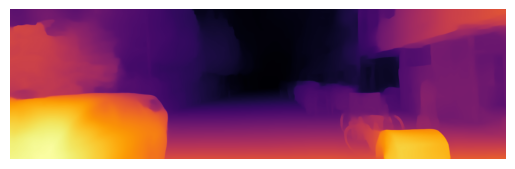

In [250]:
def normalize(inv_depth, bits=1):
    """
    normalize inv_depth map to 0-255 and apply colormap
    """

    if not np.isfinite(inv_depth).all():
        inv_depth=np.nan_to_num(inv_depth, nan=0.0, posinf=0.0, neginf=0.0)
        print("WARNING: Non-finite inv_depth values present")

    depth_min = inv_depth.min()
    depth_max = inv_depth.max()

    max_val = (2**(8*bits))-1

    if depth_max - depth_min > np.finfo("float").eps:
        out = max_val * (inv_depth - depth_min) / (depth_max - depth_min)
    else:
        out = np.zeros(inv_depth.shape, dtype=inv_depth.dtype)

    return out

out = normalize(inv_depth)
out = cv2.applyColorMap(np.uint8(out), cv2.COLORMAP_INFERNO)
plt.axis('off')
plt.imshow(cv2.cvtColor(out, cv2.COLOR_BGR2RGB))

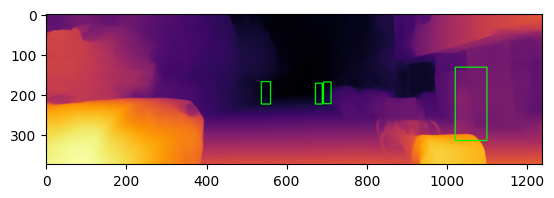

In [251]:
for xyxy in boxes_xyxy:
    cv2.rectangle(out, (xyxy[0], xyxy[1]), (xyxy[2], xyxy[3]), (0, 255, 0), 2)
# plt.figure(figsize=(int(10 * width / height), 10))
plt.imshow(cv2.cvtColor(out, cv2.COLOR_BGR2RGB))

In [252]:
rel_object_depths = []
for xywh in boxes_xywh:
    xc, yc, w, h = xywh
    rel_object_depths.append(depth[yc, xc])
rel_object_depths = np.array(rel_object_depths)
rel_object_depths

array([0.00021867, 0.00159763, 0.00132168, 0.0008304 ], dtype=float32)

In [254]:
rel_object_inv_depths = []
for xywh in boxes_xywh:
    xc, yc, w, h = xywh
    rel_object_inv_depths.append(inv_depth[yc, xc])
rel_object_inv_depths = np.array(rel_object_inv_depths)
rel_object_inv_depths

array([4573.1865 ,  625.92584,  756.6102 , 1204.2344 ], dtype=float32)

In [255]:
ds

[7.59, 23.3, 24.14, 24.22]

In [258]:
ref_d = ds[0] # use the closest one as reference depth
ref_rel_d = rel_object_depths[0]
abs_object_depths = ref_d / ref_rel_d * rel_object_depths[1:]

abs_object_depths
sqrt(mean_squared_error(ds[1:], abs_object_depths))

22.565321523866277

### calculation


In [ ]:
depth_map_dir = Path('/mnt/Win/Users/Xin/git_repo_local/MiDaS/output/kitti_multi_person')

kitti_person_folder = dataset_folder / "kitti_multi_person"
image_dir = kitti_person_folder / "images"
label_dir_depth = kitti_person_folder / "labels_depth"

target_image_path_list = sorted(list(Path(image_dir ).glob("**/*.png")))
target_label_path_list = sorted(list(Path(label_dir_depth).glob("**/*.txt")))

In [285]:
gts = []
preds = []

for i in range(len(target_image_path_list)):
    img_path = target_image_path_list[i]
    label_path = target_label_path_list[i]
    depth_map_path = depth_map_dir / "".join([img_path.stem, "-dpt_beit_large_512", ".pfm"])

    # read image
    img = cv2.imread(str(img_path))
    height, width, channel = img.shape

    # read depth
    inv_depth, scale = read_pfm(depth_map_path)
    depth = 1/(inv_depth+1e-9) # since midas uses inverse depth

    with open(label_path) as f:
        targets = f.readlines()

    targets = [line.split() for line in targets]
    # change element type to float
    targets = [[float(e) for e in line] for line in targets]
    # sort by depth
    targets = sorted(targets, key=lambda x: x[5])

    gt_ds = [] # store the absolute ground truth depth
    pred_rel_ds = [] # store the predicted relative depth 

    for line in targets:
        # xywh and in yolo format
        n = int(line[0])
        xc = int(width * float(line[1]))
        yc = int(height * float(line[2]))
        w = int(width * float(line[3]))
        h = int(height * float(line[4]))
        d = float(line[5])

        gt_ds.append(d)
        pred_rel_ds.append(depth[yc, xc]) # TODO: 改成中心点附近的平均值
        
    ref_d = gt_ds.pop(0) # use the closest one as reference depth
    ref_rel_d = pred_rel_ds.pop(0)
    pred_rel_ds = np.array(pred_rel_ds)
    pred_abs_ds = ref_d / ref_rel_d * pred_rel_ds

    gts.extend(gt_ds)
    preds.extend(pred_abs_ds)

gts = np.array(gts)
preds = np.array(preds)
mask = gts<10
print("RMSE:",f"{sqrt(mean_squared_error(gts, preds)):.2f} m")
print("RMSE < 10m:",f"{sqrt(mean_squared_error(gts[mask], preds[mask])):.2f} m")

RMSE: 15.20 m
RMSE < 10m: 5.03 m
